**VGG Network**

In [23]:
# !wget http://www.vlfeat.org/matconvnet/models/imagenet-vgg-verydeep-19.mat
# !wget https://img.theculturetrip.com/768x432/wp-content/uploads/2018/05/tubingen-2867769_1280-1.jpg
# !wget https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1280px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
!wget https://drive.google.com/open?id=16NXg8Mk1bLA89Hjy2JQWyuQGh5ZY320C
from google.colab import drive
import cv2
import imageio
import matplotlib.pyplot as plt
from google.colab import files
from PIL import Image
# drive.mount('/content/drive')
# root_path = 'gdrive/My Drive/cat_frames/' 

--2019-11-18 01:49:16--  https://drive.google.com/open?id=16NXg8Mk1bLA89Hjy2JQWyuQGh5ZY320C
Resolving drive.google.com (drive.google.com)... 108.177.97.101, 108.177.97.102, 108.177.97.113, ...
Connecting to drive.google.com (drive.google.com)|108.177.97.101|:443... connected.
HTTP request sent, awaiting response... 307 OK
Location: https://drive.google.com/file/d/16NXg8Mk1bLA89Hjy2JQWyuQGh5ZY320C/view?usp=drive_open [following]
--2019-11-18 01:49:16--  https://drive.google.com/file/d/16NXg8Mk1bLA89Hjy2JQWyuQGh5ZY320C/view?usp=drive_open
Reusing existing connection to drive.google.com:443.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘open?id=16NXg8Mk1bLA89Hjy2JQWyuQGh5ZY320C.9’

open?id=16NXg8Mk1bL     [ <=>                ]  66.41K  --.-KB/s    in 0.04s   

2019-11-18 01:49:16 (1.61 MB/s) - ‘open?id=16NXg8Mk1bLA89Hjy2JQWyuQGh5ZY320C.9’ saved [68008]



In [3]:
import tensorflow as tf
import scipy.io as sio
import numpy as np

# this has been changed to take as input 
# the input image (so the content image or style image or the trainable image (the image that has both content and style))
# model_weights is the path to the weights of the VGG net
# returns a dictionary with keys corresponding to layer name and values corresponding to the value of the network at that layer
def build_model(input_image, model_weights):
  net = {}
  vgg_rawnet     = sio.loadmat(model_weights)
  vgg_layers     = vgg_rawnet['layers'][0]
  net['input']   = input_image

  print('LAYER GROUP 1')
  net['conv1_1'] = conv_layer('conv1_1', net['input'], W=get_weights(vgg_layers, 0))
  net['relu1_1'] = relu_layer('relu1_1', net['conv1_1'], b=get_bias(vgg_layers, 0))

  net['conv1_2'] = conv_layer('conv1_2', net['relu1_1'], W=get_weights(vgg_layers, 2))
  net['relu1_2'] = relu_layer('relu1_2', net['conv1_2'], b=get_bias(vgg_layers, 2))
  
  net['pool1']   = pool_layer('pool1', net['relu1_2'])

  print('LAYER GROUP 2')  
  net['conv2_1'] = conv_layer('conv2_1', net['pool1'], W=get_weights(vgg_layers, 5))
  net['relu2_1'] = relu_layer('relu2_1', net['conv2_1'], b=get_bias(vgg_layers, 5))
  
  net['conv2_2'] = conv_layer('conv2_2', net['relu2_1'], W=get_weights(vgg_layers, 7))
  net['relu2_2'] = relu_layer('relu2_2', net['conv2_2'], b=get_bias(vgg_layers, 7))
  
  net['pool2']   = pool_layer('pool2', net['relu2_2'])
  
  print('LAYER GROUP 3')
  net['conv3_1'] = conv_layer('conv3_1', net['pool2'], W=get_weights(vgg_layers, 10))
  net['relu3_1'] = relu_layer('relu3_1', net['conv3_1'], b=get_bias(vgg_layers, 10))

  net['conv3_2'] = conv_layer('conv3_2', net['relu3_1'], W=get_weights(vgg_layers, 12))
  net['relu3_2'] = relu_layer('relu3_2', net['conv3_2'], b=get_bias(vgg_layers, 12))

  net['conv3_3'] = conv_layer('conv3_3', net['relu3_2'], W=get_weights(vgg_layers, 14))
  net['relu3_3'] = relu_layer('relu3_3', net['conv3_3'], b=get_bias(vgg_layers, 14))

  net['conv3_4'] = conv_layer('conv3_4', net['relu3_3'], W=get_weights(vgg_layers, 16))
  net['relu3_4'] = relu_layer('relu3_4', net['conv3_4'], b=get_bias(vgg_layers, 16))

  net['pool3']   = pool_layer('pool3', net['relu3_4'])

  print('LAYER GROUP 4')
  net['conv4_1'] = conv_layer('conv4_1', net['pool3'], W=get_weights(vgg_layers, 19))
  net['relu4_1'] = relu_layer('relu4_1', net['conv4_1'], b=get_bias(vgg_layers, 19))

  net['conv4_2'] = conv_layer('conv4_2', net['relu4_1'], W=get_weights(vgg_layers, 21))
  net['relu4_2'] = relu_layer('relu4_2', net['conv4_2'], b=get_bias(vgg_layers, 21))

  net['conv4_3'] = conv_layer('conv4_3', net['relu4_2'], W=get_weights(vgg_layers, 23))
  net['relu4_3'] = relu_layer('relu4_3', net['conv4_3'], b=get_bias(vgg_layers, 23))

  net['conv4_4'] = conv_layer('conv4_4', net['relu4_3'], W=get_weights(vgg_layers, 25))
  net['relu4_4'] = relu_layer('relu4_4', net['conv4_4'], b=get_bias(vgg_layers, 25))

  net['pool4']   = pool_layer('pool4', net['relu4_4'])

  print('LAYER GROUP 5')
  net['conv5_1'] = conv_layer('conv5_1', net['pool4'], W=get_weights(vgg_layers, 28))
  net['relu5_1'] = relu_layer('relu5_1', net['conv5_1'], b=get_bias(vgg_layers, 28))

  net['conv5_2'] = conv_layer('conv5_2', net['relu5_1'], W=get_weights(vgg_layers, 30))
  net['relu5_2'] = relu_layer('relu5_2', net['conv5_2'], b=get_bias(vgg_layers, 30))

  net['conv5_3'] = conv_layer('conv5_3', net['relu5_2'], W=get_weights(vgg_layers, 32))
  net['relu5_3'] = relu_layer('relu5_3', net['conv5_3'], b=get_bias(vgg_layers, 32))

  net['conv5_4'] = conv_layer('conv5_4', net['relu5_3'], W=get_weights(vgg_layers, 34))
  net['relu5_4'] = relu_layer('relu5_4', net['conv5_4'], b=get_bias(vgg_layers, 34))

  net['pool5']   = pool_layer('pool5', net['relu5_4'])

  return net

def conv_layer(layer_name, layer_input, W):
  conv = tf.nn.conv2d(layer_input, W, strides=[1, 1, 1, 1], padding='SAME')
  return conv

def relu_layer(layer_name, layer_input, b):
  relu = tf.nn.relu(layer_input + b)
  return relu

def pool_layer(layer_name, layer_input):
  pool = tf.nn.avg_pool(layer_input, ksize=[1, 2, 2, 1], 
      strides=[1, 2, 2, 1], padding='SAME')
  return pool

def get_weights(vgg_layers, i):
  weights = vgg_layers[i][0][0][2][0][0]
  W = tf.constant(weights)
  return W

def get_bias(vgg_layers, i):
  bias = vgg_layers[i][0][0][2][0][1]
  b = tf.constant(np.reshape(bias, (bias.size)))
  return b

Get Images

[[[217 208 211]
  [221 212 217]
  [216 207 212]
  ...
  [230 230 230]
  [230 230 230]
  [230 230 230]]

 [[234 225 226]
  [220 211 214]
  [224 215 220]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[214 207 201]
  [218 209 210]
  [219 210 215]
  ...
  [254 254 254]
  [254 254 254]
  [254 254 254]]

 ...

 [[ 30  23  17]
  [ 33  26  20]
  [ 34  26  23]
  ...
  [ 22  13  14]
  [ 21  15  15]
  [ 21  15  15]]

 [[ 38  31  21]
  [ 46  39  33]
  [ 40  32  29]
  ...
  [ 19  13  13]
  [ 22  16  16]
  [ 25  21  20]]

 [[ 25  24  22]
  [ 32  24  22]
  [ 35  24  22]
  ...
  [ 21  12  13]
  [ 21  12  13]
  [ 21  12  13]]]


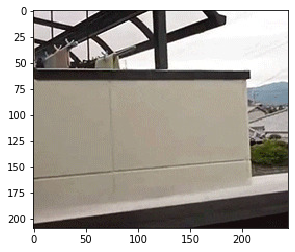

In [7]:
import PIL.Image
from matplotlib import pyplot as plt
# drive/My Drive/cat_frames/frame_29.jpg
content_image = PIL.Image.open('/content/drive/My Drive/cat_frames/cat/frame_31_delay-0.07s.jpg')
print(np.array(content_image))
w, h = content_image.size
content_image = np.array(content_image)
plt.imshow(content_image)

d = 3

plt.imshow(content_image)

[[[144  57  17]
  [176  74  35]
  [168  49  10]
  ...
  [187 116  30]
  [182 109  24]
  [187 113  27]]

 [[149  64  23]
  [164  64  24]
  [159  41   1]
  ...
  [155  94  19]
  [155  92  18]
  [152  87  13]]

 [[150  69  26]
  [155  59  17]
  [186  72  32]
  ...
  [134  92  40]
  [130  86  34]
  [118  71  21]]

 ...

 [[187 157 134]
  [172 137 102]
  [144 103  59]
  ...
  [ 74  68  25]
  [ 65  51   8]
  [ 82  62  11]]

 [[192 166 144]
  [165 129  96]
  [146 106  62]
  ...
  [ 91  86  41]
  [ 94  79  40]
  [102  80  30]]

 [[201 173 152]
  [157 122  88]
  [144 104  60]
  ...
  [103  98  53]
  [103  88  48]
  [ 97  75  25]]]


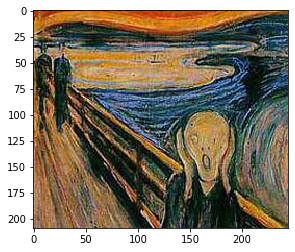

In [8]:
style_image = PIL.Image.open("drive/My Drive/cat_frames/scream.jpg")
style_image = style_image.resize((w, h), PIL.Image.LANCZOS)
style_image = np.array(style_image)
print(style_image)
plt.imshow(style_image)

In [10]:
# our inputs are 3d images [w, h, d] but tensorflow expects 4: [None, w, h, d]
print(style_image.shape)
style_image = np.expand_dims(style_image, axis=0)
content_image = np.expand_dims(content_image, axis=0)
print(style_image.shape)
print(content_image.shape)
_, w, h, d = style_image.shape

(209, 245, 3)
(1, 209, 245, 3)
(1, 209, 245, 3)


Define Graph

In [0]:
content_layers = ['conv4_2']
style_layers = ['relu1_1', 'relu2_1', 'relu3_1', 'relu4_1', 'relu5_1']

In [12]:
final_image = tf.Variable(content_image, trainable=True, dtype=tf.float32)
style_input = tf.placeholder(tf.float32, shape=[None, w, h, d])
content_input = tf.placeholder(tf.float32, shape=[None, w, h, d])

# define nets for content, image, final_image
final_image_net = build_model(final_image, '/content/imagenet-vgg-verydeep-19.mat')
content_image_net = build_model(content_input, '/content/imagenet-vgg-verydeep-19.mat')
style_image_net = build_model(style_input, '/content/imagenet-vgg-verydeep-19.mat')

LAYER GROUP 1
LAYER GROUP 2
LAYER GROUP 3
LAYER GROUP 4
LAYER GROUP 5
LAYER GROUP 1
LAYER GROUP 2
LAYER GROUP 3
LAYER GROUP 4
LAYER GROUP 5
LAYER GROUP 1
LAYER GROUP 2
LAYER GROUP 3
LAYER GROUP 4
LAYER GROUP 5


In [0]:
def gram_matrix(tensor):
  # reshape tensor into [w*h, d] with tensorflow
  # multiply tensor.T * tensor (transpose with tensorflow)
  # 40 x 40 x 3, need to flatten it
  # tf.reshape into 1600 x 3
  shape = tensor.get_shape()
  tensor = tf.reshape(tensor, (-1, int(shape[3])))
  # tensor = tf.reshape(tensor, shape=(-1, d))
  tensor = tf.matmul(tf.transpose(tensor), tensor) 
  return tensor

# define loss
# content loss is the mse between the two layers
# 
content_loss = 0
# style is mse between gram matrices
style_loss = 0
for layer in final_image_net.keys():
  if layer in content_layers:
    content_loss += tf.reduce_sum((final_image_net[layer] - content_image_net[layer]) ** 2)
  if layer in style_layers:
    style_loss += tf.reduce_sum((gram_matrix(final_image_net[layer]) - gram_matrix(style_image_net[layer])) ** 2) # loss in layer
total_loss = 1e-6 * content_loss / len(content_layers) + style_loss / len(style_layers)

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


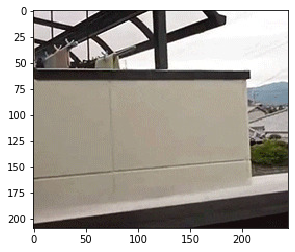

8.9772025e+20


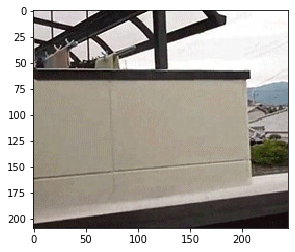

8.971876e+20


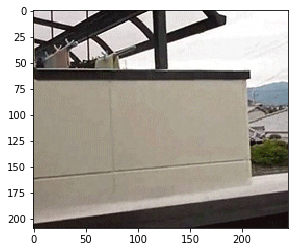

8.950596e+20


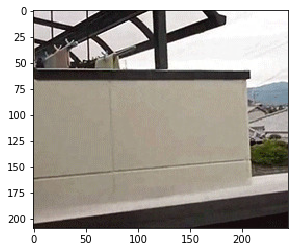

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8.866249e+20


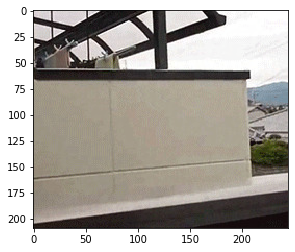

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8.546539e+20


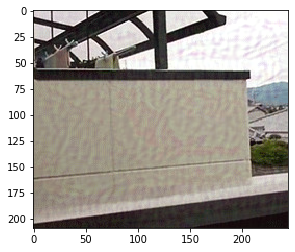

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6.106188e+20


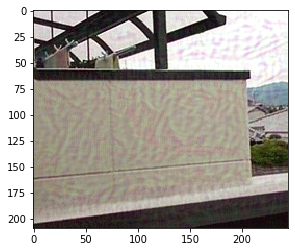

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5.0963617e+20


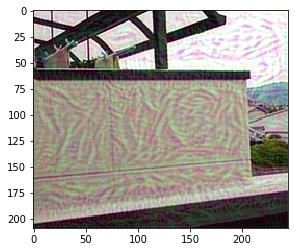

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.2856792e+20


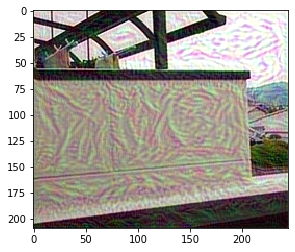

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2.6810996e+20


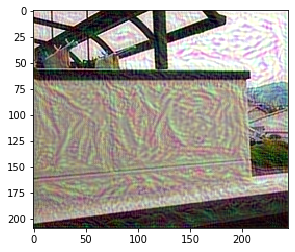

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2.1971302e+20


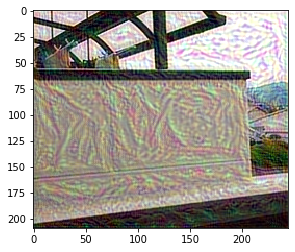

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.8339726e+20


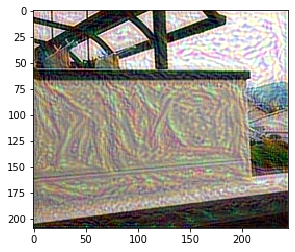

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.5078613e+20


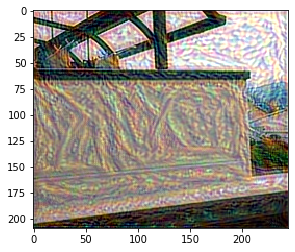

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.11688e+20


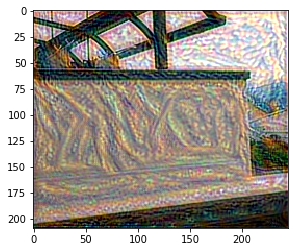

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8.580561e+19


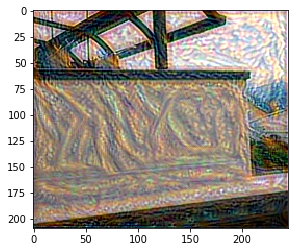

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7.2037807e+19


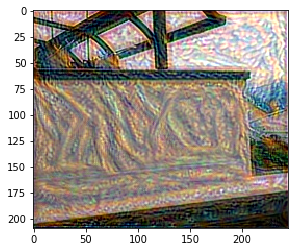

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6.3905247e+19


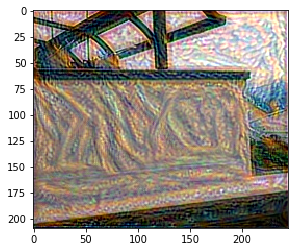

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5.4754267e+19


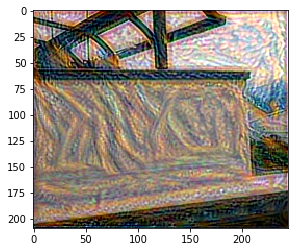

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4.7028395e+19


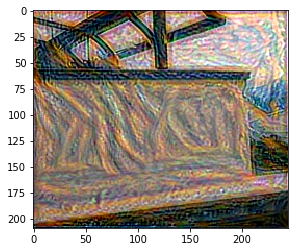

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.737975e+19


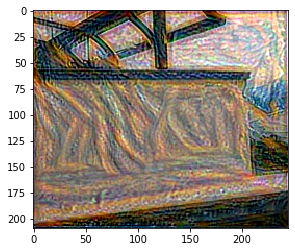

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2.9582648e+19


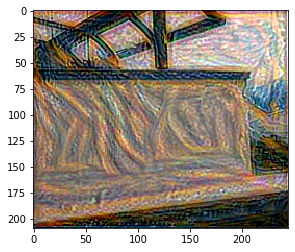

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2.7308682e+19


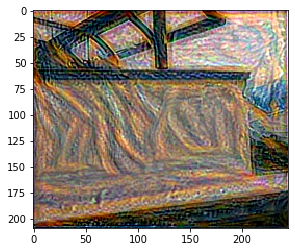

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2.466673e+19


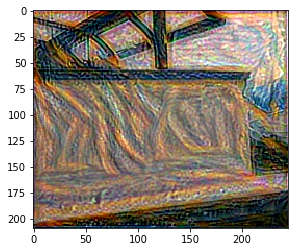

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2.1971954e+19


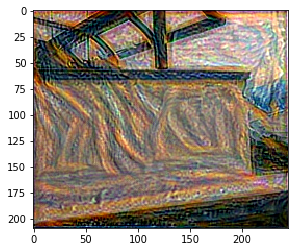

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.9625988e+19


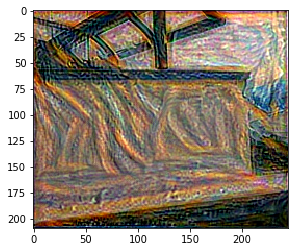

1.7025387e+19


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


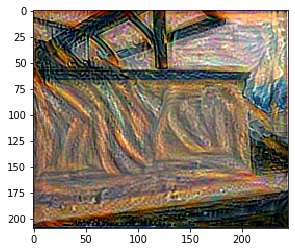

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.5049045e+19


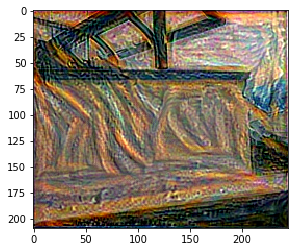

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.3572833e+19


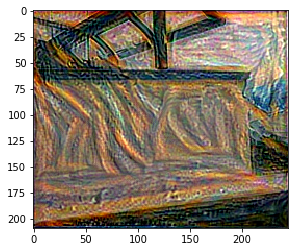

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.2891316e+19


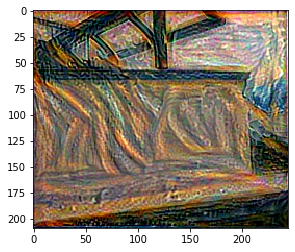

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.2081076e+19


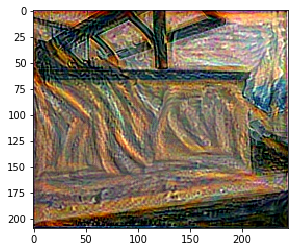

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.1066502e+19


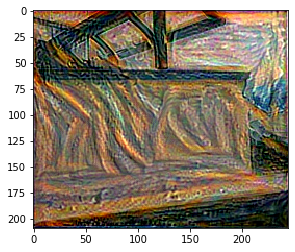

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0167749e+19


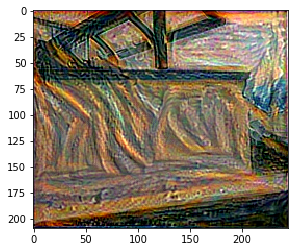

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9.1867786e+18


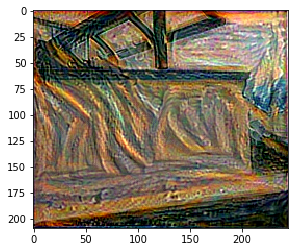

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8.3392987e+18


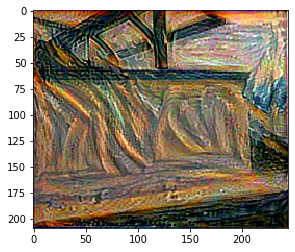

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7.729624e+18


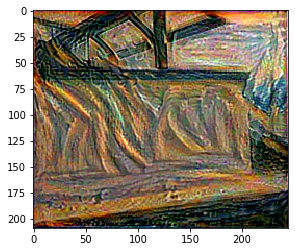

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7.5594267e+18


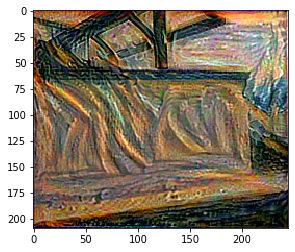

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7.3648104e+18


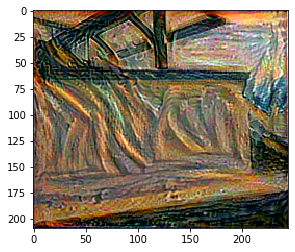

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6.7934513e+18


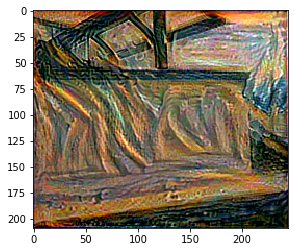

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6.006373e+18


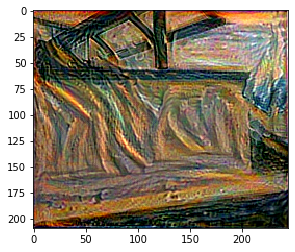

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5.481516e+18


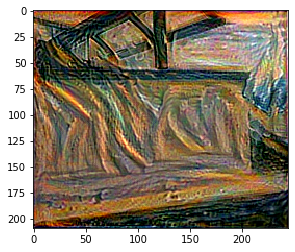

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5.262192e+18


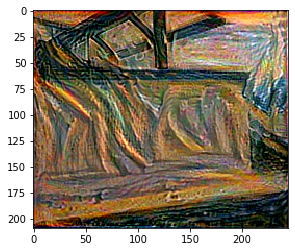

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5.634882e+18


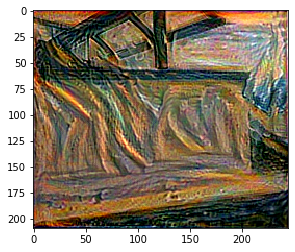

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5.0653616e+18


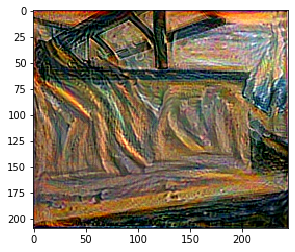

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4.799746e+18


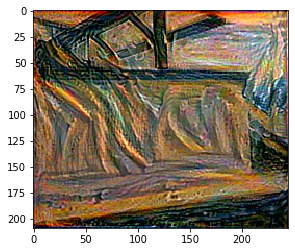

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4.5271003e+18


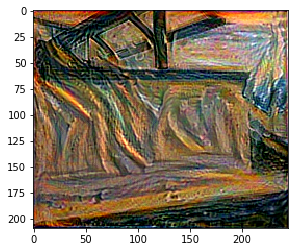

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4.3278996e+18


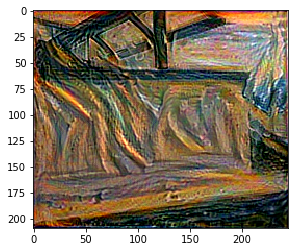

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4.214827e+18


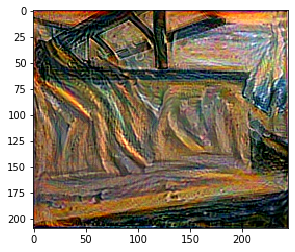

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4.0599362e+18


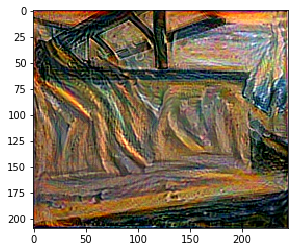

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.9159349e+18


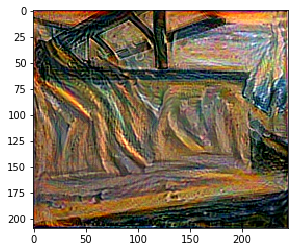

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.7153342e+18


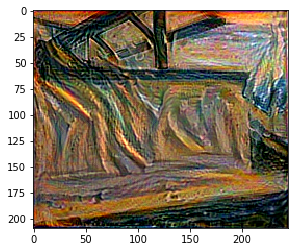

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.4822476e+18


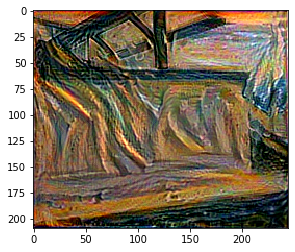

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.323631e+18


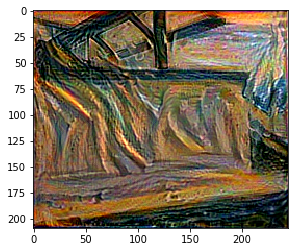

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.170691e+18


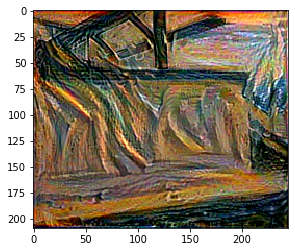

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.113075e+18


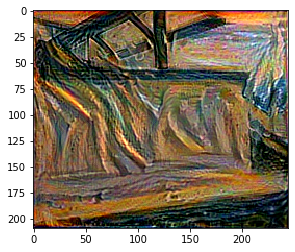

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.004059e+18


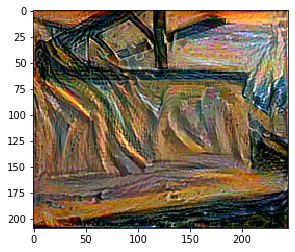

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2.9207116e+18


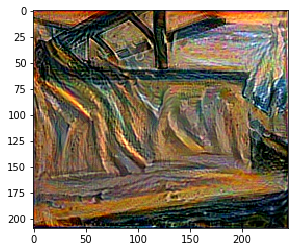

2.8184584e+18
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 2818458419827048448.000000
  Number of iterations: 50
  Number of functions evaluations: 56
[[[[274.29535   250.28796   249.41501  ]
   [268.68878   228.17688   227.90807  ]
   [238.34734   185.32314   184.60898  ]
   ...
   [103.001854   74.90352    79.22628  ]
   [ 95.16186    60.81302    73.04103  ]
   [184.67105   164.97198   162.11203  ]]

  [[269.33298   222.39104   224.51913  ]
   [201.68323   118.67974   126.11558  ]
   [180.05661    78.62145    78.833694 ]
   ...
   [ 88.76694    44.096775   30.438908 ]
   [ 75.192474   24.353819   20.954184 ]
   [180.28033   151.63676   135.17241  ]]

  [[213.8561    146.62718   138.52203  ]
   [164.5847     47.00381    37.830677 ]
   [194.68962    66.200485   25.357243 ]
   ...
   [166.67368   129.57149    44.413387 ]
   [158.44185   116.652275   49.965878 ]
   [211.75493   189.57285   133.48792  ]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


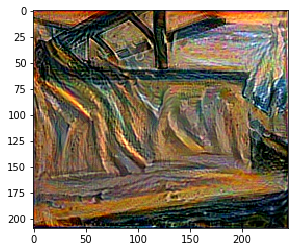

In [14]:
# define optimizer
# scale content loss 
optimizer = tf.contrib.opt.ScipyOptimizerInterface(total_loss, method='L-BFGS-B', options={'maxiter': 50})
def print_img(total_loss, final_image):
  plt.imshow(final_image[0,:,:,:].astype(int))
  plt.show()
  print(total_loss)
  
with tf.Session() as sess:
  # pull in the value of the session 
  sess.run(tf.global_variables_initializer())
  optimizer.minimize(sess, fetches=[total_loss, final_image], loss_callback=print_img, feed_dict={style_input: style_image, content_input: content_image})
  # [1, w, h, 3]
  final_img = sess.run(final_image)
  print(final_img)
  plt.imshow(final_img[0,:,:,:].astype(int))
  
  # call optimizer while feeding in the content and style images

In [28]:
final_img = final_img[0,:,:,:].astype(int)

IndexError: ignored

In [34]:
final_img

array([[[274, 250, 249],
        [268, 228, 227],
        [238, 185, 184],
        ...,
        [103,  74,  79],
        [ 95,  60,  73],
        [184, 164, 162]],

       [[269, 222, 224],
        [201, 118, 126],
        [180,  78,  78],
        ...,
        [ 88,  44,  30],
        [ 75,  24,  20],
        [180, 151, 135]],

       [[213, 146, 138],
        [164,  47,  37],
        [194,  66,  25],
        ...,
        [166, 129,  44],
        [158, 116,  49],
        [211, 189, 133]],

       ...,

       [[ 13, -23, -14],
        [ 32, -30, -15],
        [ 87,  19,  22],
        ...,
        [107,  91,  36],
        [ 85,  56,  13],
        [ 17, -13, -25]],

       [[ 99,  78,  85],
        [ 93,  50,  87],
        [ 51,   5,  49],
        ...,
        [ 77,  64,  28],
        [ 60,  30,   3],
        [ 18, -11, -17]],

       [[ 46,  44,  65],
        [  8, -11,  39],
        [-19, -37,  20],
        ...,
        [ 67,  58,  41],
        [ 46,  23,  12],
        [ 22,  -2,  -1]]

In [0]:
# text_file = open("drive/My Drive/cat_frames/output/frame30.jpg", "w")
# text_file.write(final_image)
# uploaded = drive.CreateFile({'text_file': 'filename.jpg'})
# uploaded.SetContentFile('filename.jpg')
# uploaded.Upload()
# print('Uploaded file with ID {}'.format(uploaded.get('id')))
# print(final_img)
# im = Image.fromarray(np.divide(final_img, 256))
# im.save("30.jpg")
final_img
im = Image.fromarray(final_img, mode = 'RGB')
im.save("drive/My Drive/cat_frames/cat/your_file.jpeg")